# Data visualization

In [1]:
# https://ipython.org/ipython-doc/3/config/extensions/autoreload.html
%load_ext autoreload
%autoreload 2

In [2]:
import os 
import sys

import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

import seaborn as sns

In [3]:
root_path = os.path.abspath("..")
if root_path not in sys.path:
    sys.path.append(root_path)

In [4]:
from common.dataflow import get_train_df, get_test_df, get_image, get_target, get_inc_angle
from common.dataflow_visu_utils import display_image

In [5]:
from mpl_toolkits.axes_grid1 import ImageGrid

## Explore train dataset

In [6]:
train_df = get_train_df()
len(train_df), train_df.dtypes

(1604, band_1         object
 band_2         object
 id             object
 inc_angle     float64
 is_iceberg      int64
 dtype: object)

In [7]:
train_df.head()

,band_1,band_2,id,inc_angle,is_iceberg
0,"[-27.878360999999998, -27.15416, -28.668615, -...","[-27.154118, -29.537888, -31.0306, -32.190483,...",dfd5f913,43.9239,0
1,"[-12.242375, -14.920304999999999, -14.920363, ...","[-31.506321, -27.984554, -26.645678, -23.76760...",e25388fd,38.1562,0
2,"[-24.603676, -24.603714, -24.871029, -23.15277...","[-24.870956, -24.092632, -20.653963, -19.41104...",58b2aaa0,45.2859,1
3,"[-22.454607, -23.082819, -23.998013, -23.99805...","[-27.889421, -27.519794, -27.165262, -29.10350...",4cfc3a18,43.8306,0
4,"[-26.006956, -23.164886, -23.164886, -26.89116...","[-27.206915, -30.259186, -30.259186, -23.16495...",271f93f4,35.6256,0


In [30]:
train_df.isnull().any(axis=0)

band_1        False
band_2        False
id            False
inc_angle      True
is_iceberg    False
dtype: bool

Statistics:
- target (is_iceberg)
- inc_angle

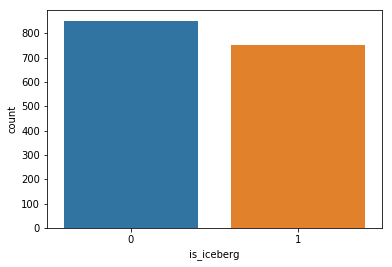

In [33]:
sns.countplot(train_df['is_iceberg'])

In [34]:
train_df['inc_angle'].describe()

count    1471.000000
mean       39.268707
std         3.839744
min        24.754600
25%        36.106100
50%        39.501500
75%        42.559100
max        45.937500
Name: inc_angle, dtype: float64

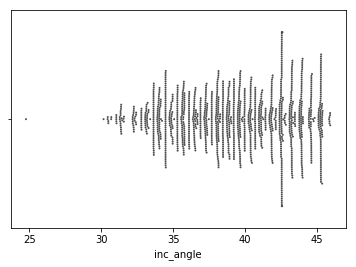

In [42]:
sns.swarmplot(x="inc_angle", data=train_df, size=2, color=".3", linewidth=0)

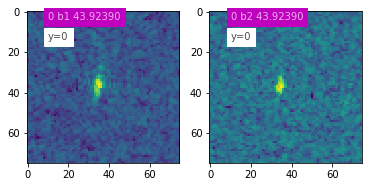

In [8]:
id_num = 0
x = get_image(id_num, train_df)
y = get_target(id_num, train_df)
inc_angle = get_inc_angle(id_num, train_df)

ax = plt.subplot(121)
display_image(ax, x[:, :, 0], id_num, "b1", inc_angle, y)
ax = plt.subplot(122)
display_image(ax, x[:, :, 1], id_num, "b2", inc_angle, y)

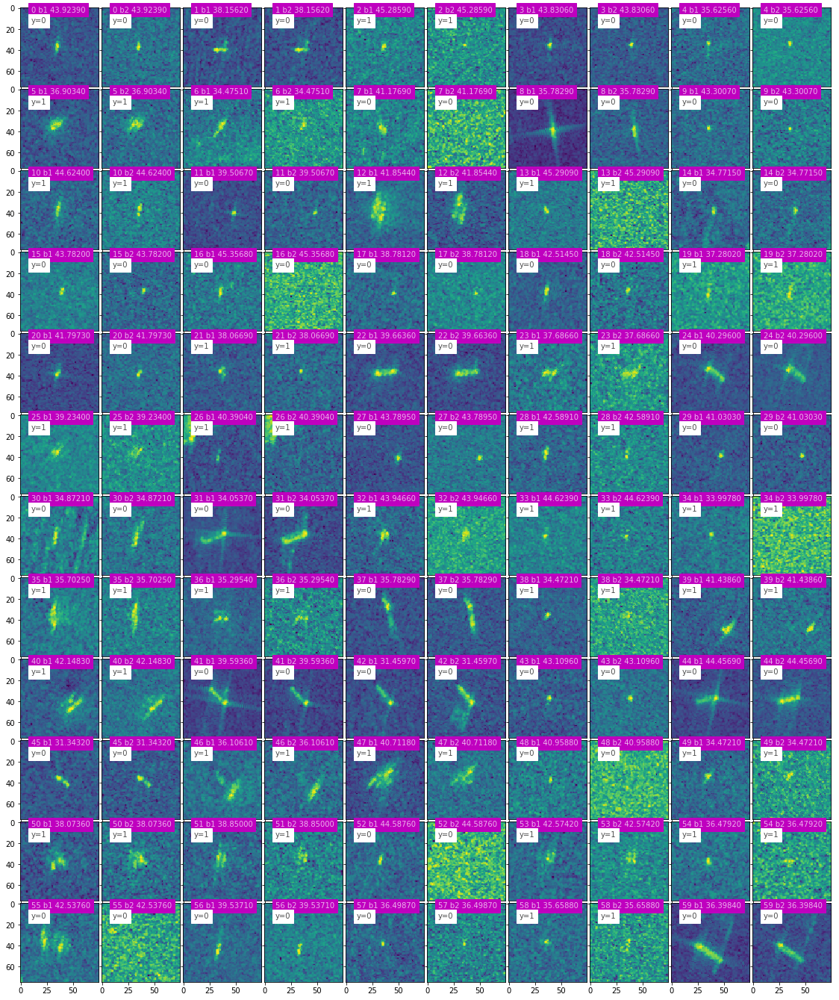

In [12]:
nx = 5
ny = 12

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        id_num = np.ravel_multi_index((i, j), (ny, nx))    
        x = get_image(id_num, train_df)
        y = get_target(id_num, train_df)
        inc_angle = get_inc_angle(id_num, train_df)        
        
        ax = grid[2*id_num]
        display_image(ax, x[:, :, 0], id_num, "b1", inc_angle, y)
        ax = grid[2*id_num + 1]
        display_image(ax, x[:, :, 1], id_num, "b2", inc_angle, y)        

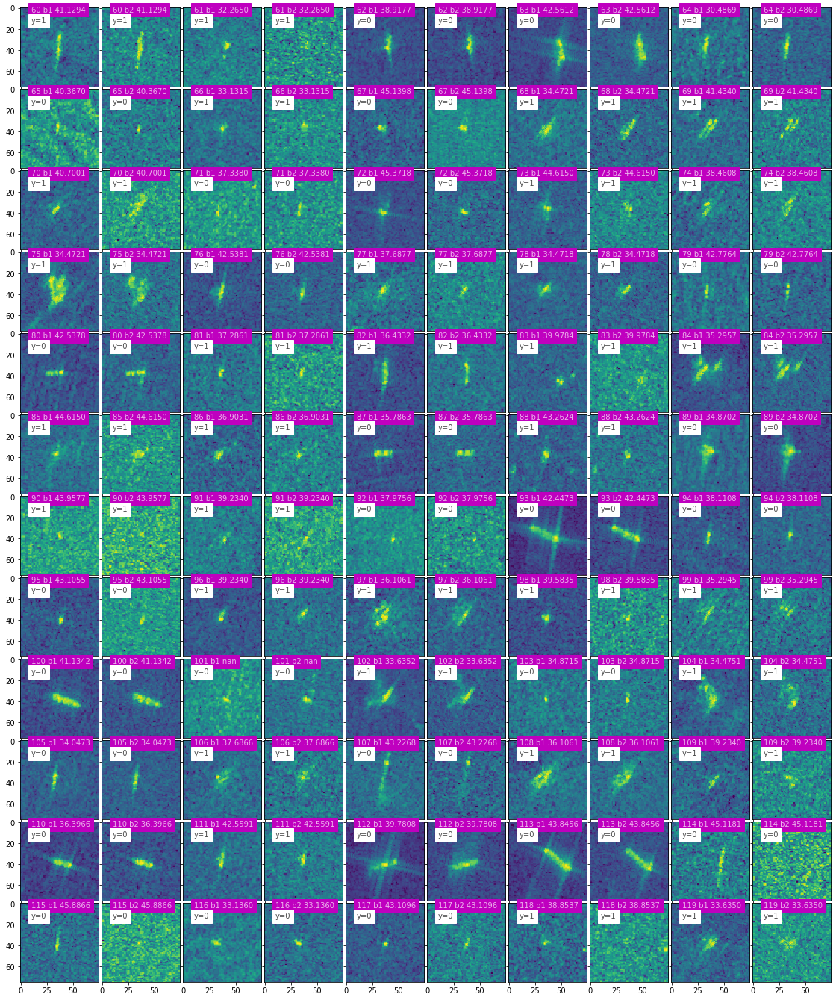

In [73]:
offset = 60
nx = 5
ny = 12

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx))    
        id_num = offset + k
        x = get_image(id_num, train_df)
        y = get_target(id_num, train_df)
        inc_angle = get_inc_angle(id_num, train_df)        
        
        ax = grid[2*k]
        display_image(ax, x[:, :, 0], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[:, :, 1], id_num, "b2", inc_angle, y)        

Let's visualize the data with lowest values inc_angle:

In [75]:
id_nums = train_df[train_df['inc_angle'] < 33.0].index
len(id_nums)

64

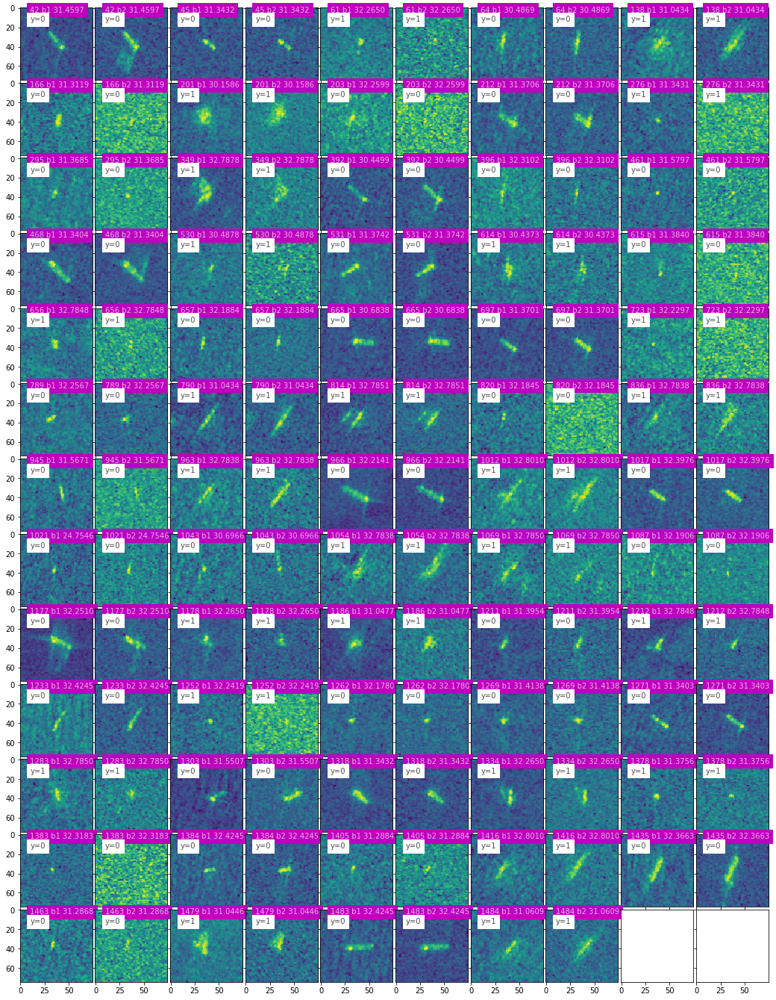

In [77]:
nx = 5
ny = 13

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx)) 
        if k >= len(id_nums):
            continue
        id_num = id_nums[k]
        x = get_image(id_num, train_df)
        y = get_target(id_num, train_df)
        inc_angle = get_inc_angle(id_num, train_df)        
        
        ax = grid[2*k]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

Let's visualize images that have NaN values of inc_angle

In [93]:
id_nums = train_df[train_df['inc_angle'].isnull()].index
len(id_nums)

133

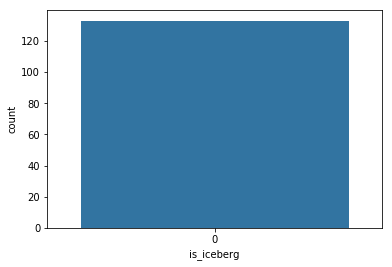

In [97]:
sns.countplot(train_df[train_df['inc_angle'].isnull()]['is_iceberg'])

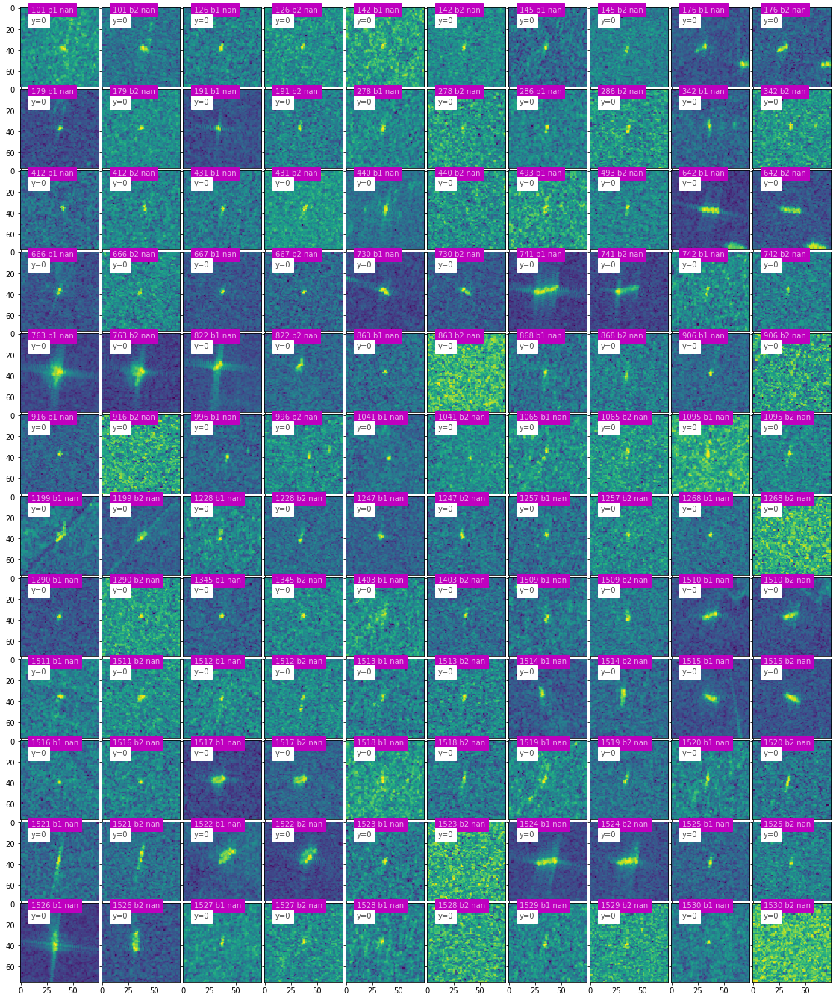

In [94]:
nx = 5
ny = 12

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx)) 
        if k >= len(id_nums):
            continue
        id_num = id_nums[k]
        x = get_image(id_num, train_df)
        y = get_target(id_num, train_df)
        inc_angle = get_inc_angle(id_num, train_df)        
        
        ax = grid[2*k]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

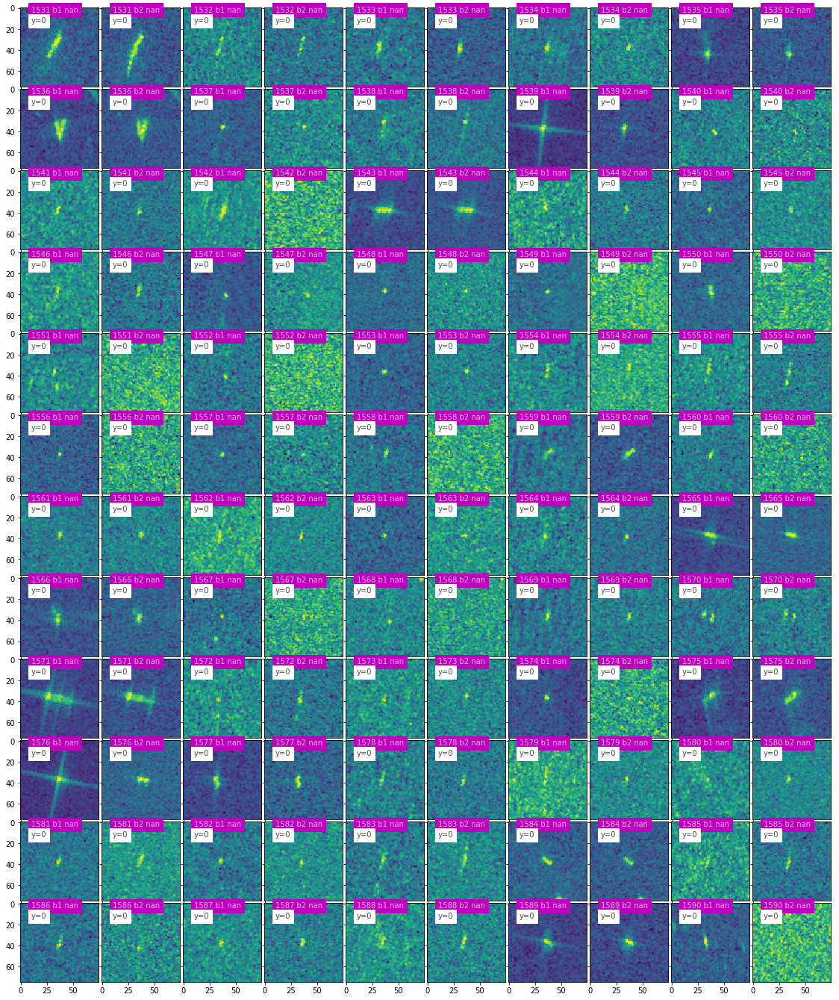

In [95]:
id_nums = id_nums[60:]

nx = 5
ny = 12

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx)) 
        if k >= len(id_nums):
            continue
        id_num = id_nums[k]
        x = get_image(id_num, train_df)
        y = get_target(id_num, train_df)
        inc_angle = get_inc_angle(id_num, train_df)        
        
        ax = grid[2*k]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

## Explore test dataset

In [79]:
test_df = get_test_df()
len(test_df), test_df.dtypes

(8424, band_1        object
 band_2        object
 id            object
 inc_angle    float64
 dtype: object)

In [81]:
test_df.head()

,band_1,band_2,id,inc_angle
0,"[-15.863251, -15.201077, -17.887735, -19.17248...","[-21.629612, -21.142353, -23.908337, -28.34524...",5941774d,34.966400
1,"[-26.058969497680664, -26.058969497680664, -26...","[-25.754207611083984, -25.754207611083984, -25...",4023181e,32.615072
2,"[-14.14109992980957, -15.064241409301758, -17....","[-14.74563980102539, -14.590410232543945, -14....",b20200e4,37.505433
3,"[-12.167478, -13.706167, -16.54837, -13.572674...","[-24.32222, -26.375538, -24.096739, -23.8769, ...",e7f018bb,34.473900
4,"[-23.37459373474121, -26.02718162536621, -28.1...","[-25.72234344482422, -27.011577606201172, -23....",4371c8c3,43.918874


In [80]:
test_df.isnull().any(axis=0)

band_1       False
band_2       False
id           False
inc_angle    False
dtype: bool

In [84]:
test_df['inc_angle'].describe()

count    8424.000000
mean       40.153403
std         4.108386
min        23.080500
25%        36.905200
50%        40.375790
75%        43.472950
max        50.661785
Name: inc_angle, dtype: float64

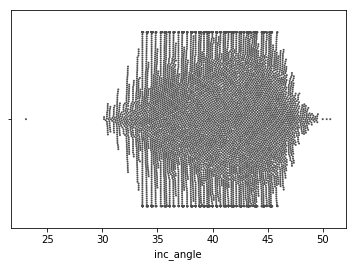

In [83]:
sns.swarmplot(x="inc_angle", data=test_df, size=2, color=".3", linewidth=0)

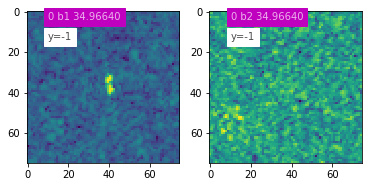

In [88]:
id_num = 0
x = get_image(id_num, test_df)
inc_angle = get_inc_angle(id_num, test_df)

ax = plt.subplot(121)
display_image(ax, x[0, :, :], id_num, "b1", inc_angle, target=-1)
ax = plt.subplot(122)
display_image(ax, x[1, :, :], id_num, "b2", inc_angle, target=-1)

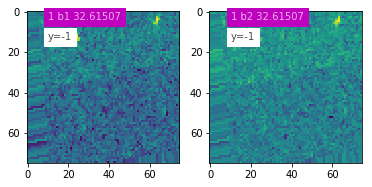

In [116]:
id_num = 1
x = get_image(id_num, test_df)
inc_angle = get_inc_angle(id_num, test_df)

ax = plt.subplot(121)
display_image(ax, x[0, :, :], id_num, "b1", inc_angle, target=-1)
ax = plt.subplot(122)
display_image(ax, x[1, :, :], id_num, "b2", inc_angle, target=-1)

> Please note that we have included machine-generated images in the test set to prevent hand labeling. They are excluded in scoring. 

These images can be recognized by inc_angle precision.

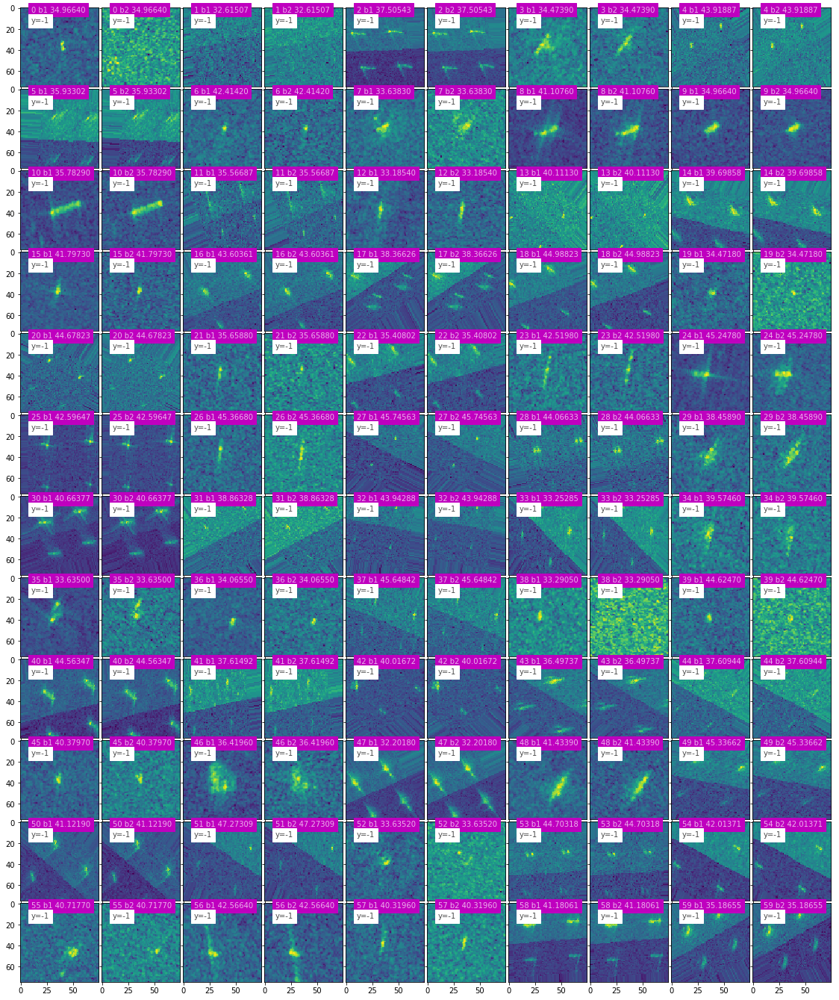

In [89]:
nx = 5
ny = 12

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        id_num = np.ravel_multi_index((i, j), (ny, nx))    
        x = get_image(id_num, test_df)
        y = -1
        inc_angle = get_inc_angle(id_num, test_df)        
        
        ax = grid[2*id_num]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*id_num + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

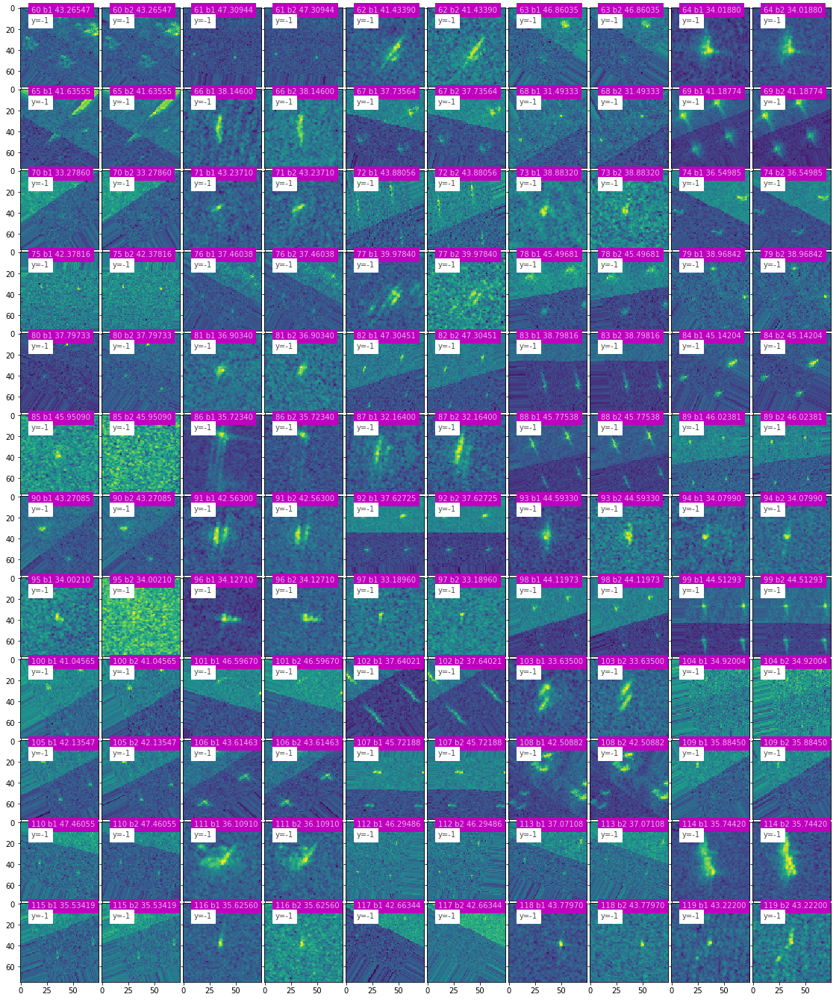

In [90]:
offset = 60
nx = 5
ny = 12

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx))    
        id_num = offset + k
        x = get_image(id_num, test_df)
        y = -1
        inc_angle = get_inc_angle(id_num, test_df)        
        
        ax = grid[2*k]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

Let's visualize the data with lowest values inc_angle:

In [109]:
id_nums = test_df[test_df['inc_angle'] < 33.0].index
len(id_nums)

274

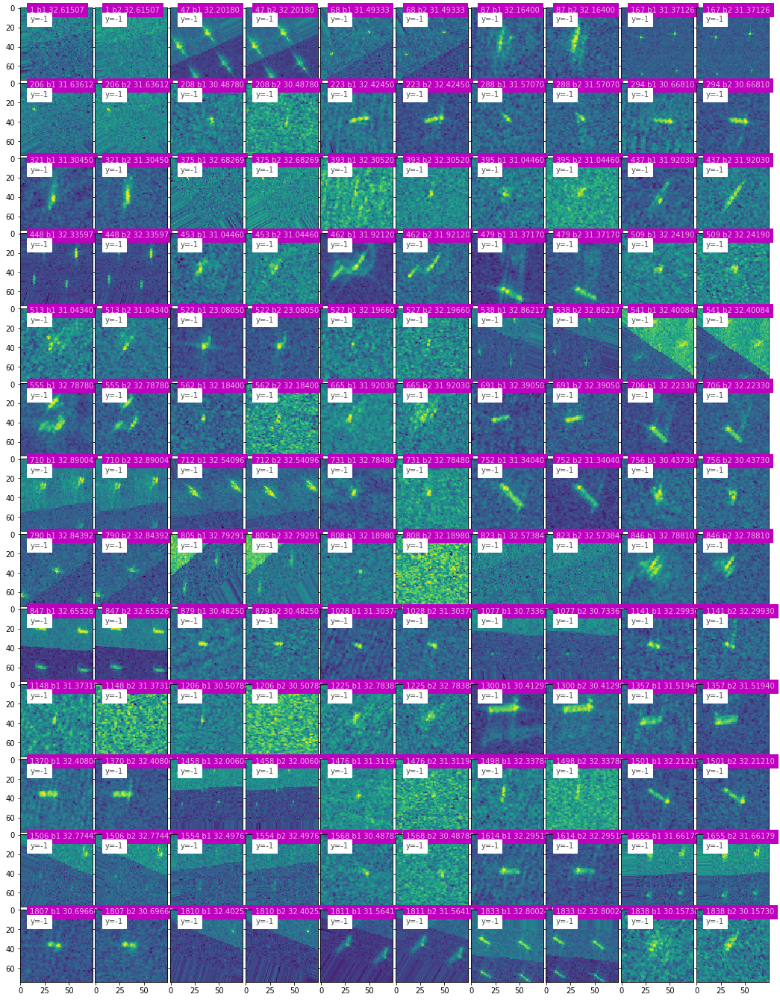

In [110]:
nx = 5
ny = 13

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx)) 
        if k >= len(id_nums):
            continue
        id_num = id_nums[k]
        x = get_image(id_num, test_df)
        y = -1
        inc_angle = get_inc_angle(id_num, test_df)        
        
        ax = grid[2*k]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

In [114]:
id_nums = test_df[test_df['inc_angle'] > 47.0].index
len(id_nums)

235

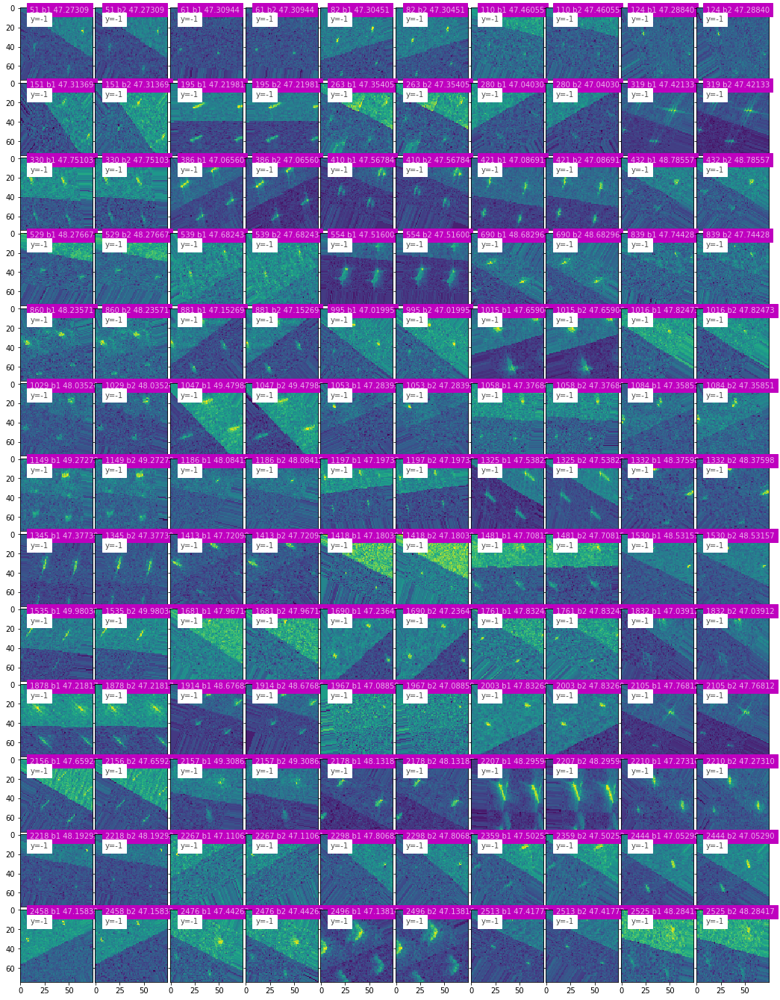

In [115]:
nx = 5
ny = 13

fig = plt.figure(figsize=(24,24))
grid = ImageGrid(fig, 111, nrows_ncols=(ny, nx*2), axes_pad=0.05)

for i in range(ny):
    for j in range(nx):
        
        k = np.ravel_multi_index((i, j), (ny, nx)) 
        if k >= len(id_nums):
            continue
        id_num = id_nums[k]
        x = get_image(id_num, test_df)
        y = -1
        inc_angle = get_inc_angle(id_num, test_df)        
        
        ax = grid[2*k]
        display_image(ax, x[0, :, :], id_num, "b1", inc_angle, y)
        ax = grid[2*k + 1]
        display_image(ax, x[1, :, :], id_num, "b2", inc_angle, y)        

Let's filter out generated images

In [120]:
a0 = test_df.loc[0, 'inc_angle']
a1 = test_df.loc[1, 'inc_angle']
a2 = test_df.loc[2, 'inc_angle']

In [123]:
a1 * 1e4 - int(a1 * 1e4)

0.72051740332972258

In [125]:
def is_generated(a):
    return a * 1e4 - int(a * 1e4) > 0.01

In [126]:
test_df['generated'] = test_df['inc_angle'].apply(is_generated)

In [127]:
test_df.head()

,band_1,band_2,id,inc_angle,generated
0,"[-15.863251, -15.201077, -17.887735, -19.17248...","[-21.629612, -21.142353, -23.908337, -28.34524...",5941774d,34.966400,False
1,"[-26.058969497680664, -26.058969497680664, -26...","[-25.754207611083984, -25.754207611083984, -25...",4023181e,32.615072,True
2,"[-14.14109992980957, -15.064241409301758, -17....","[-14.74563980102539, -14.590410232543945, -14....",b20200e4,37.505433,True
3,"[-12.167478, -13.706167, -16.54837, -13.572674...","[-24.32222, -26.375538, -24.096739, -23.8769, ...",e7f018bb,34.473900,False
4,"[-23.37459373474121, -26.02718162536621, -28.1...","[-25.72234344482422, -27.011577606201172, -23....",4371c8c3,43.918874,True


In [131]:
len(test_df[test_df['generated'] == True]), len(test_df[test_df['generated'] == False])

(5189, 3235)

In [132]:
real_test_df = test_df[test_df['generated'] == False]

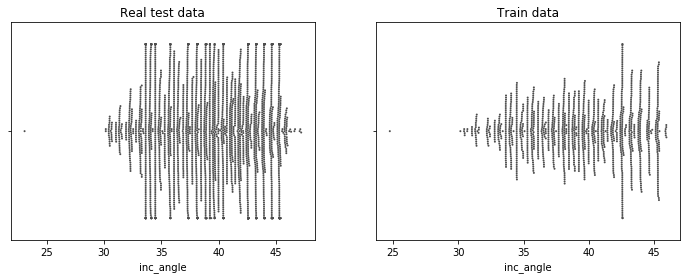

In [134]:
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.title("Real test data")
sns.swarmplot(x="inc_angle", data=real_test_df, size=2, color=".3", linewidth=0)
plt.subplot(122)
plt.title("Train data")
sns.swarmplot(x="inc_angle", data=train_df, size=2, color=".3", linewidth=0)

### Train data NaN inc_angle

Data overview says that :
> Note that this field has missing data marked as "na", and those images with "na" incidence angles are all in the training data to prevent leakage.

In [100]:
ids_na = train_df[train_df['inc_angle'].isnull()]['id']

In [105]:
id_num = ids_na.index[0]

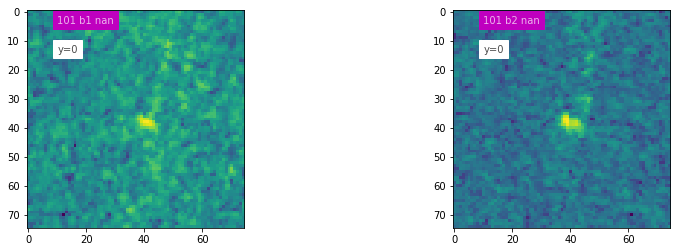

In [107]:
x = get_image(id_num, train_df)
y = get_target(id_num, train_df)
a = get_inc_angle(id_num, train_df)
plt.figure(figsize=(14, 4))
ax = plt.subplot(121)
display_image(ax, x[0, :, :], id_num, "b1", a, y)
ax = plt.subplot(122)
display_image(ax, x[1, :, :], id_num, "b2", a, y)